In [1]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import matthews_corrcoef 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from keras.models import Sequential 
from keras.layers import Dense
from keras.layers import Input
from keras.utils import np_utils
from collections import defaultdict
from numpy.random import seed
from numpy.random import randint
from typing import List, Optional
from math import floor
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import operator
import time
import os


Using TensorFlow backend.


In [2]:
# TRANSFORM FILE

# Changing seperators to ",", because double space caused problems with pandas.
# I renamed the file yeast.data to data.txt.
# Uncomment and exeute, if newdata.csv does not exist.
'''
file = open("data.txt", "r")
lines = file.readlines()
file.close()
new_lines = []
for l in lines:
    # To replace double space.
    nl = l.replace("  ", ",")
    # To replace double comma.
    nl = nl.replace(",,", ",")
    # To eliminate any space left.
    nl = nl.replace(" ", "")

    new_lines.append(nl)

file = open("newdata.csv", "w")
file.writelines(new_lines)
file.close()'''

'\nfile = open("data.txt", "r")\nlines = file.readlines()\nfile.close()\nnew_lines = []\nfor l in lines:\n    # To replace double space.\n    nl = l.replace("  ", ",")\n    # To replace double comma.\n    nl = nl.replace(",,", ",")\n    # To eliminate any space left.\n    nl = nl.replace(" ", "")\n\n    new_lines.append(nl)\n\nfile = open("newdata.csv", "w")\nfile.writelines(new_lines)\nfile.close()'

In [3]:
# Util function for setting plot size
def set_size(w, h, ax=None):
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

In [4]:
# Loading data.
names = ["name", "MCG", "GVH", "ALM", "MIT", "ERL", "POX", "VAC", "NUC", "class"]
data = pd.read_csv("newdata.csv", sep=",",names=names, header=None)
print(f"Dataset size: {len(data)}")
print(data.head(5))

Dataset size: 1484
         name   MCG   GVH   ALM   MIT  ERL  POX   VAC   NUC class
0  ADT1_YEAST  0.58  0.61  0.47  0.13  0.5  0.0  0.48  0.22   MIT
1  ADT2_YEAST  0.43  0.67  0.48  0.27  0.5  0.0  0.53  0.22   MIT
2  ADT3_YEAST  0.64  0.62  0.49  0.15  0.5  0.0  0.53  0.22   MIT
3  AAR2_YEAST  0.58  0.44  0.57  0.13  0.5  0.0  0.54  0.22   NUC
4  AATM_YEAST  0.42  0.44  0.48  0.54  0.5  0.0  0.48  0.22   MIT


In [5]:
# 1.1) CLEANING

# Dropping name column, because we don't need the Accession number for the SWISS-PROT database.
data.drop("name", axis=1, inplace=True)
print(f"Dataset size: {len(data)}")
print(data.head(5))

Dataset size: 1484
    MCG   GVH   ALM   MIT  ERL  POX   VAC   NUC class
0  0.58  0.61  0.47  0.13  0.5  0.0  0.48  0.22   MIT
1  0.43  0.67  0.48  0.27  0.5  0.0  0.53  0.22   MIT
2  0.64  0.62  0.49  0.15  0.5  0.0  0.53  0.22   MIT
3  0.58  0.44  0.57  0.13  0.5  0.0  0.54  0.22   NUC
4  0.42  0.44  0.48  0.54  0.5  0.0  0.48  0.22   MIT


In [6]:
# Dropping rows with NA value.
print(f"Dataset size before: {len(data)}")
data.dropna(inplace=True)
data.head(5)
print(f"Dataset size after: {len(data)}")
print(data.head(5))

Dataset size before: 1484
Dataset size after: 1484
    MCG   GVH   ALM   MIT  ERL  POX   VAC   NUC class
0  0.58  0.61  0.47  0.13  0.5  0.0  0.48  0.22   MIT
1  0.43  0.67  0.48  0.27  0.5  0.0  0.53  0.22   MIT
2  0.64  0.62  0.49  0.15  0.5  0.0  0.53  0.22   MIT
3  0.58  0.44  0.57  0.13  0.5  0.0  0.54  0.22   NUC
4  0.42  0.44  0.48  0.54  0.5  0.0  0.48  0.22   MIT


In [7]:
# Dropping records with wrong class. Maybe, the dataset contains records with unaccpetable class.
# Accepted classes.
CLASSES = ["CYT", "NUC", "MIT", "ME3", "ME2", "ME1", "EXC", "VAC", "POX", "ERL"]

print(f"Dataset size before: {len(data)}")
data = data[data['class'].isin(CLASSES)]
print(f"Dataset size after: {len(data)}")
print(data.head(5))

Dataset size before: 1484
Dataset size after: 1484
    MCG   GVH   ALM   MIT  ERL  POX   VAC   NUC class
0  0.58  0.61  0.47  0.13  0.5  0.0  0.48  0.22   MIT
1  0.43  0.67  0.48  0.27  0.5  0.0  0.53  0.22   MIT
2  0.64  0.62  0.49  0.15  0.5  0.0  0.53  0.22   MIT
3  0.58  0.44  0.57  0.13  0.5  0.0  0.54  0.22   NUC
4  0.42  0.44  0.48  0.54  0.5  0.0  0.48  0.22   MIT


In [8]:
# 1.2) STANDARDIZATION

# Data to np arrays
x = np.array(data.iloc[:,:8])
print(x[:5])

[[0.58 0.61 0.47 0.13 0.5  0.   0.48 0.22]
 [0.43 0.67 0.48 0.27 0.5  0.   0.53 0.22]
 [0.64 0.62 0.49 0.15 0.5  0.   0.53 0.22]
 [0.58 0.44 0.57 0.13 0.5  0.   0.54 0.22]
 [0.42 0.44 0.48 0.54 0.5  0.   0.48 0.22]]


In [9]:
# Standarize data
std = StandardScaler().fit_transform(x)
print(std[:5])

[[ 0.58198136  0.88848148 -0.3466451  -0.95720258 -0.09759001 -0.0991314
  -0.34417514 -0.5279193 ]
 [-0.51089067  1.37281104 -0.23122636  0.06431174 -0.09759001 -0.0991314
   0.52121948 -0.5279193 ]
 [ 1.01913017  0.96920307 -0.11580762 -0.81127196 -0.09759001 -0.0991314
   0.52121948 -0.5279193 ]
 [ 0.58198136 -0.48378562  0.80754232 -0.95720258 -0.09759001 -0.0991314
   0.69429841 -0.5279193 ]
 [-0.5837488  -0.48378562 -0.23122636  2.03437508 -0.09759001 -0.0991314
  -0.34417514 -0.5279193 ]]


In [10]:
# Standardized data to DataFrame
standardized_data = data.copy()
standardized_data.iloc[:,:-1] = std[:,:]
standardized_data.head(5)

,MCG,GVH,ALM,MIT,ERL,POX,VAC,NUC,class
0,0.581981,0.888481,-0.346645,-0.957203,-0.09759,-0.099131,-0.344175,-0.527919,MIT
1,-0.510891,1.372811,-0.231226,0.064312,-0.09759,-0.099131,0.521219,-0.527919,MIT
2,1.019130,0.969203,-0.115808,-0.811272,-0.09759,-0.099131,0.521219,-0.527919,MIT
3,0.581981,-0.483786,0.807542,-0.957203,-0.09759,-0.099131,0.694298,-0.527919,NUC
4,-0.583749,-0.483786,-0.231226,2.034375,-0.09759,-0.099131,-0.344175,-0.527919,MIT


In [11]:
# 1.3) DATA REDUCTION

def plot_attributes_hist(data, bins):
    fig, ax = plt.subplots(4,2)
    set_size(10,10)
    # Exclude class column
    for i in range(len(data.columns) - 1):
        x = data.iloc[:, i]
        ax[i // 2, i % 2].hist(x, bins=bins)
        ax[i // 2, i % 2].set_xlabel(data.columns.values[i])

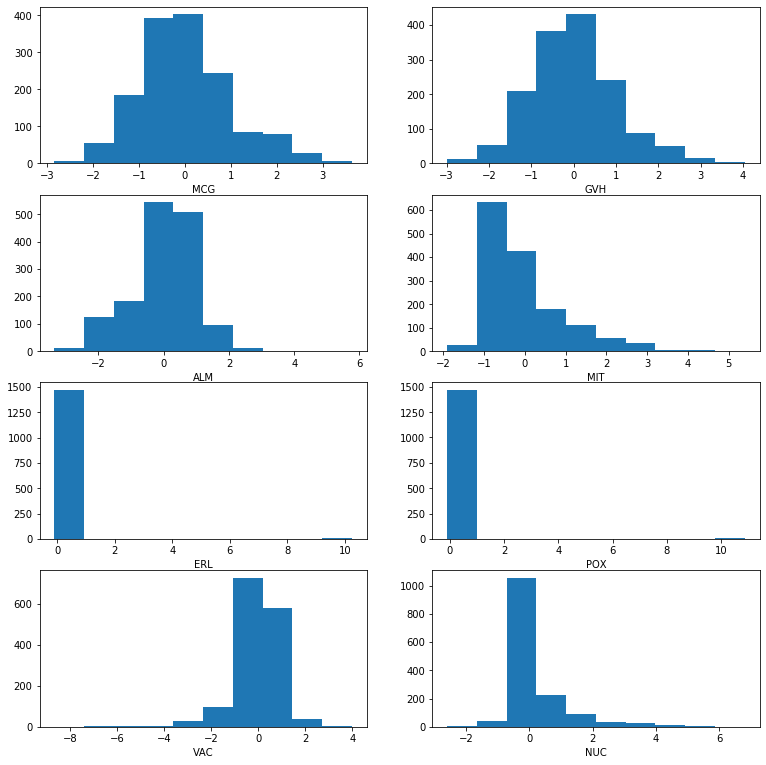

In [12]:
# Histogram of each attribute.
# We may exclude low frequency values from the final data, in order to reduce dataset size.
# Example: Exclude all rows where frq(x) < 10 where xE D(mcg) and frq the frequency
plot_attributes_hist(standardized_data,10)

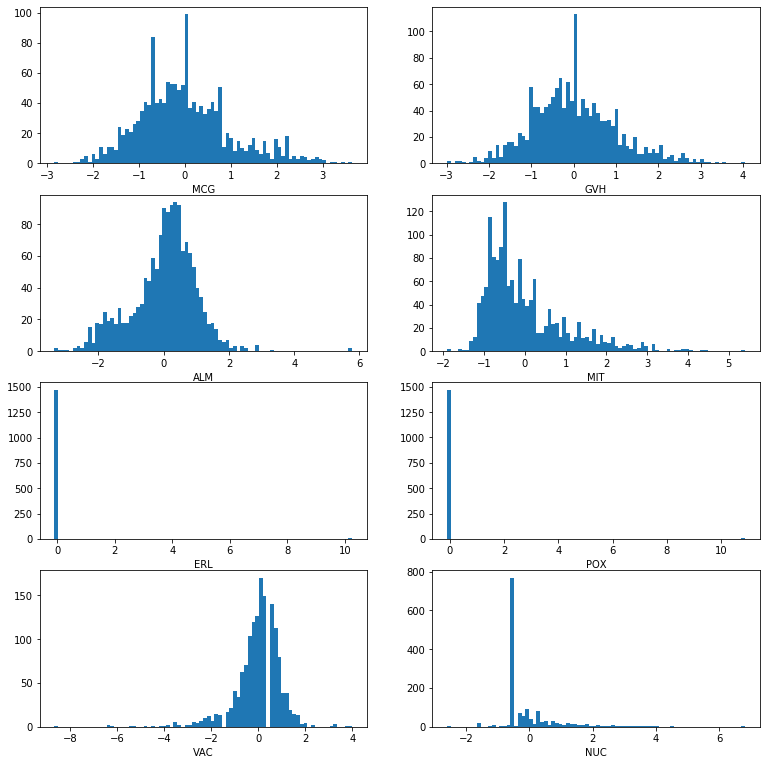

In [13]:
plot_attributes_hist(standardized_data,80)

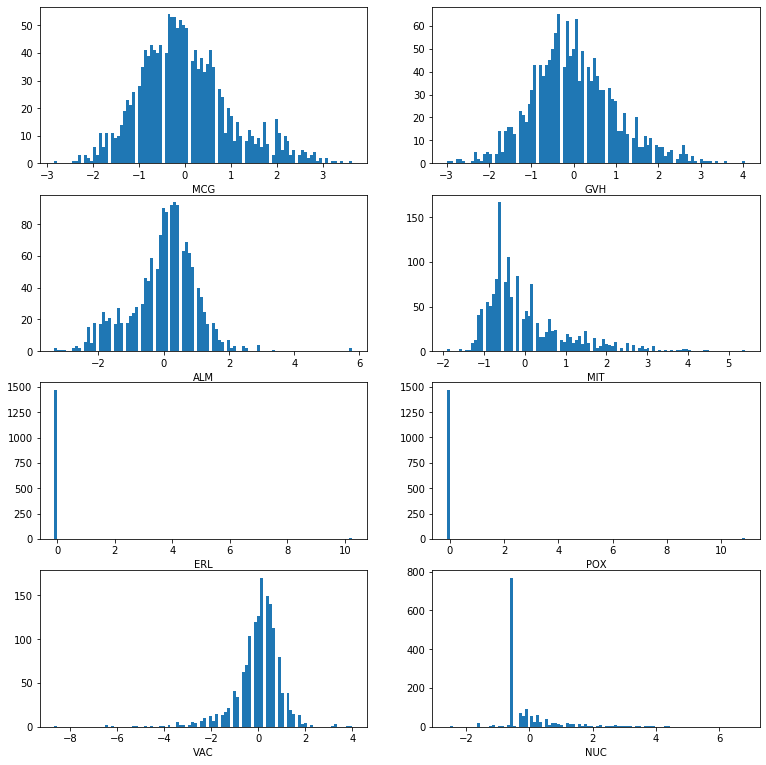

In [14]:
plot_attributes_hist(standardized_data,100)

In [15]:
# Dropping records with low frequency attributes
# Example: Exclude all row with mcg > 3 adn mcg < -2
reduced_data = standardized_data.drop(standardized_data[((standardized_data["MCG"] > 3.0) | (standardized_data["MCG"] < -2.0))].index)
print(f"Dataset size before: {len(data)}")
print(f"Dataset size after: {len(reduced_data)}")
print(reduced_data.head(5))

Dataset size before: 1484
Dataset size after: 1466
        MCG       GVH       ALM       MIT      ERL       POX       VAC  \
0  0.581981  0.888481 -0.346645 -0.957203 -0.09759 -0.099131 -0.344175   
1 -0.510891  1.372811 -0.231226  0.064312 -0.09759 -0.099131  0.521219   
2  1.019130  0.969203 -0.115808 -0.811272 -0.09759 -0.099131  0.521219   
3  0.581981 -0.483786  0.807542 -0.957203 -0.09759 -0.099131  0.694298   
4 -0.583749 -0.483786 -0.231226  2.034375 -0.09759 -0.099131 -0.344175   

        NUC class  
0 -0.527919   MIT  
1 -0.527919   MIT  
2 -0.527919   MIT  
3 -0.527919   NUC  
4 -0.527919   MIT  


In [16]:
def get_colors(classes):
    colors = {}
    i = 0
    for c in classes:
        colors[c]=i
        i+=1
    return colors

# This function creates 81 scatter plots.
# Plots are grouped in eights, one for each attribute.
# Each plot shows the relationship between the i-th and the j-th attribute
# We might get some idea of the correlation between attributes, in order to reduce the dimensions.
def plot_correlation(data, classes):
    fig = plt.figure(figsize=(4, 2))
    outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)
    set_size(20,40)
    colors = get_colors(classes)
    for i in range(len(data.columns) - 1):
        inner = gridspec.GridSpecFromSubplotSpec(4,2,
                    subplot_spec=outer[i], wspace=0.15, hspace=0.5)     
        for j in range(len(data.columns) - 1):
            ax = plt.Subplot(fig, inner[j])
            if i != j:
                x = data.iloc[:, i]
                y = data.iloc[:, j]
                c = data["class"].replace(colors)
                ax.scatter(x,y,c=c)
            ax.set_xlabel(data.columns.values[i])
            ax.set_ylabel(data.columns.values[j])
            fig.add_subplot(ax)
    fig.show()


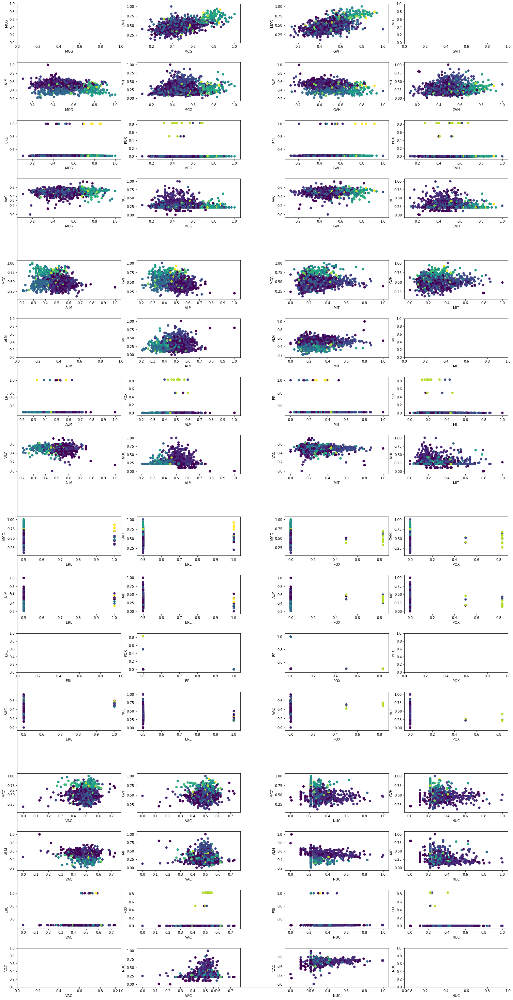

In [17]:
# EXECUTION TIME ~70''
plot_correlation(data, CLASSES)

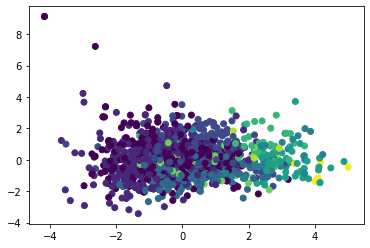

In [18]:
# We may, also, use PCA for dimensionailty reduction.
# But, some variables may contain strong predictive signals for some classes. 
# Thus, PCA could lead us to loss of information.
# Let's reduce the dimensions from 8 to 2, so as the visualization is simpler.

# https://www.datacamp.com/community/tutorials/principal-component-analysis-in-python?utm_source=adwords_ppc&utm_campaignid=9942305733&utm_adgroupid=100189364546&utm_device=c&utm_keyword=&utm_matchtype=b&utm_network=g&utm_adpostion=&utm_creative=255798340456&utm_targetid=aud-522010995285:dsa-929501846124&utm_loc_interest_ms=&utm_loc_physical_ms=9075555&gclid=CjwKCAjwiMj2BRBFEiwAYfTbCmfHjGiIh6AxDhhzZCN7zzSEkXPUCK6AYLBGH-x4793yn1sOuzWI0hoC_mUQAvD_BwE
# https://www.quora.com/What-should-I-use-to-reduce-attributes-in-my-dataset-PCA-or-feature-selection-algorithms

X = np.array(standardized_data.iloc[:,:-1])

pca = PCA(n_components=2)
pca_x = pca.fit_transform(X)
colors = get_colors(CLASSES)
plt.scatter(pca_x[:,0], pca_x[:,1], c=data["class"].replace(colors))

In [19]:
# Τhe information eventually retained is quite low.
c1 = pca.explained_variance_ratio_[0]
c2 = pca.explained_variance_ratio_[1]
print("Component 1 holds {:.3f}% of the informaiton.".format(c1))
print("Component 2 holds {:.3f}% of the informaiton.".format(c2))

Component 1 holds 0.227% of the informaiton.
Component 2 holds 0.159% of the informaiton.


In [20]:
# 2) Clustering

def print_confusion_matrix(
    y_true: np.ndarray,
    y_pred: np.ndarray,
    labels: Optional[List] = None,
    hide_zeroes: bool = False,
    hide_diagonal: bool = False,
    hide_threshold: Optional[float] = None,
):
    if labels is None:
        labels = np.unique(np.concatenate((y_true, y_pred)))
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    # find which fixed column width will be used for the matrix
    columnwidth = max(
        [len(str(x)) for x in labels] + [5]
    )  # 5 is the minimum column width, otherwise the longest class name
    empty_cell = ' ' * columnwidth

    # top-left cell of the table that indicates that top headers are predicted classes, left headers are true classes
    padding_fst_cell = (columnwidth - 3) // 2  # double-slash is int division
    fst_empty_cell = padding_fst_cell * ' ' + 't/p' + ' ' * (columnwidth - padding_fst_cell - 3)

    # Print header
    print('    ' + fst_empty_cell, end=' ')
    for label in labels:
        print(f'{label:{columnwidth}}', end=' ')  # right-aligned label padded with spaces to columnwidth

    print()  # newline
    # Print rows
    for i, label in enumerate(labels):
        print(f'    {label:{columnwidth}}', end=' ')  # right-aligned label padded with spaces to columnwidth
        for j in range(len(labels)):
            # cell value padded to columnwidth with spaces and displayed with 1 decimal
            cell = f'{cm[i, j]:{columnwidth}.1f}'
            if hide_zeroes:
                cell = cell if float(cm[i, j]) != 0 else empty_cell
            if hide_diagonal:
                cell = cell if i != j else empty_cell
            if hide_threshold:
                cell = cell if cm[i, j] > hide_threshold else empty_cell
            print(cell, end=' ')
        print()

def get_cluster_report(true_labels, pred_labels, matched_classes):
    trans = lambda x: matched_classes[x]
    decoder = np.vectorize(trans)
    decoded_labels = decoder(pred_labels)


    print("Confusion Matrix:")
    print_confusion_matrix(true_labels, decoded_labels)
    print()
    class_report = classification_report(true_labels, decoded_labels)
    print(f"Classification Report:\n{class_report}\n")


def match_classes(true_labels, pred_labels, classes, verbose = True):

    if -1 in pred_labels:
        frq = {k: {clss: 0 for clss in classes} for k in range(-1,len(set(pred_labels)) - 1)}
        clusters = {k: [] for k in range(-1,len(set(pred_labels)) - 1)}
    else:
        frq = {k: {clss: 0 for clss in classes} for k in range(len(set(pred_labels)))}    
        clusters = {k: [] for k in range(len(set(pred_labels)))}

    for i in range(len(pred_labels)):
        clusters[pred_labels[i]].append(true_labels[i])    

    matched_classes = {}
    if verbose:
        print("Matched Classes:")
    for k,v in clusters.items():
        for clss in v:
            frq[k][clss] +=1
        matched_classes[k] = max(frq[k].items(), key=operator.itemgetter(1))[0]
        if k == -1:
            matched_classes[k] = 'NOISE'
        if verbose:
            print(f"{k} -> {matched_classes[k]}")
    return matched_classes


X = np.array(standardized_data.iloc[:,:-1])
original_class_frequency = standardized_data.iloc[:,-1].value_counts()
print(f"Original Frequencies:\n{original_class_frequency}")

Original Frequencies:
CYT    463
NUC    429
MIT    244
ME3    163
ME2     51
ME1     44
EXC     35
VAC     30
POX     20
ERL      5
Name: class, dtype: int64


In [21]:
# 2.1) KMeans

# k-means++ initializes the centroids in such way that the results are more accurate.
kmeans = KMeans(n_clusters=len(CLASSES), init='k-means++').fit(X)
predicted_class_frequency = pd.Series(kmeans.labels_).value_counts()
print(f"Predicted Frequencies: \n{predicted_class_frequency}\n")

matched_classes = match_classes(standardized_data['class'].values, kmeans.labels_, CLASSES)

print(f"{'=' * 12} Report for KMeans {'=' * 12}\n")
get_cluster_report(standardized_data['class'].values, kmeans.labels_, matched_classes)

Predicted Frequencies: 
8    317
9    258
6    191
0    166
2    165
1    164
5    123
7     71
4     15
3     14
dtype: int64

Matched Classes:
0 -> ME1
1 -> ME3
2 -> CYT
3 -> ERL
4 -> POX
5 -> NUC
6 -> MIT
7 -> CYT
8 -> CYT
9 -> NUC
============ Report for KMeans ============

Confusion Matrix:
     t/p  CYT   ERL   EXC   ME1   ME2   ME3   MIT   NUC   POX   VAC   
    CYT   284.0   4.0   0.0   8.0   0.0   7.0  27.0 132.0   1.0   0.0 
    ERL     0.0   5.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0 
    EXC     4.0   0.0   0.0  30.0   0.0   0.0   0.0   1.0   0.0   0.0 
    ME1     0.0   0.0   0.0  44.0   0.0   0.0   0.0   0.0   0.0   0.0 
    ME2     5.0   1.0   0.0  37.0   0.0   4.0   0.0   4.0   0.0   0.0 
    ME3    11.0   1.0   0.0  13.0   0.0 126.0   1.0  11.0   0.0   0.0 
    MIT    64.0   0.0   0.0  18.0   0.0   5.0 133.0  21.0   3.0   0.0 
    NUC   170.0   3.0   0.0   6.0   0.0  15.0  27.0 208.0   0.0   0.0 
    POX     4.0   0.0   0.0   2.0   0.0   1.0   1.0   1.0  11.0

In [22]:
# "Supervised"(?) kmeans

# Execute kmeans with 300 random values for random_state and find the one that produces the minimum 
# class frequency square distance.
#
# If orginal_class_frequency: [frq(CYT), frq(NUC),...,frq(ERL)] and predicted_class_frequency: 
# [frq(a1), frq(a2),...,frq(a10)]
# where ai E [0,10] the predicted labels, then we try to find a random_state, so that the Euclidean distance between orginal_class_frequency
# and predicted_class_frequency is minimized.
# Thereafter, we can sort the classes by their frequency and match each predicted class (number) with one original class based on the sorted
# position.
#
# In this way, we try to optimize the performance of the kmeans.
# I am not sure if this implementation counts as a supervised or an unsupervised learning.

# EXECUTION TIME ~54''
min_dist = np.iinfo(np.int32).max
seed(1)
for i in range(300):
    rand_state = randint(0,500)
    kmeans = KMeans(n_clusters=len(CLASSES), init='k-means++', random_state=rand_state).fit(X)
    predicted_class_frequency = pd.Series(kmeans.labels_).value_counts()
    # Calculate the distance and keep the minimum.
    dist = np.linalg.norm(np.array(original_class_frequency) - np.array(predicted_class_frequency), 2)
    if dist < min_dist:
        min_dist = dist
        min_labels = kmeans.labels_

print(f"Minimum distance: {min_dist}\n")
min_predicted_class_frequency = pd.Series(min_labels).value_counts()
print(f"Predicted Frequencies: \n{min_predicted_class_frequency}\n")

matched_classes = match_classes(standardized_data['class'].values, min_labels, CLASSES)
print(f"{'=' * 12} Report for KMeans {'=' * 12}\n")
get_cluster_report(standardized_data['class'].values, min_labels, matched_classes)


Minimum distance: 186.47251808242416

Predicted Frequencies: 
0    394
3    315
5    195
7    160
6    122
9    119
1     88
8     62
4     15
2     14
dtype: int64

Matched Classes:
0 -> CYT
1 -> CYT
2 -> ERL
3 -> NUC
4 -> POX
5 -> MIT
6 -> NUC
7 -> ME3
8 -> EXC
9 -> ME1
============ Report for KMeans ============

Confusion Matrix:
     t/p  CYT   ERL   EXC   ME1   ME2   ME3   MIT   NUC   POX   VAC   
    CYT   243.0   4.0   5.0  10.0   0.0   6.0  30.0 164.0   1.0   0.0 
    ERL     0.0   5.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0 
    EXC     3.0   0.0  25.0   6.0   0.0   0.0   0.0   1.0   0.0   0.0 
    ME1     0.0   0.0  11.0  33.0   0.0   0.0   0.0   0.0   0.0   0.0 
    ME2     4.0   1.0  11.0  27.0   0.0   4.0   0.0   4.0   0.0   0.0 
    ME3     9.0   1.0   0.0  16.0   0.0 125.0   1.0  11.0   0.0   0.0 
    MIT    58.0   0.0   3.0  17.0   0.0   3.0 135.0  25.0   3.0   0.0 
    NUC   153.0   3.0   3.0   3.0   0.0  15.0  27.0 225.0   0.0   0.0 
    POX     3.0   0.0   2

In [23]:
# Data preparation for DBSCAN
# Those algorithms use an additional class, -1, as "NOISE"
# So, inspecting the above histogram, we decide that if an attribute value is lower or greater than a threshold then
# that record's class will be set to "NOISE"

def data_prep_noise(standardized_data):
    standardized_data_with_noise = standardized_data.copy()
    for i in range(len(standardized_data_with_noise)):
        record = standardized_data_with_noise.iloc[i,:]
        
        cnt = 0
        if not -2.5 < record["MCG"] < 3.5 or not -2.8 < record["GVH"] < 3.5 or not -3 < record["ALM"] < 4 or not -1.8 < record["MIT"] < 4.5 or not -6 < record["VAC"] < 3.5 or not -2 < record["NUC"] < 6:

            standardized_data_with_noise.at[i, 'class'] = "NOISE"

    original_class_with_noise_frequency = standardized_data_with_noise.iloc[:,-1].value_counts()
    return (standardized_data_with_noise, original_class_with_noise_frequency)

In [24]:
# 2.2) DBSCAN
# Curse of dimensionality, https://stats.stackexchange.com/questions/270631/why-are-most-of-my-points-classified-as-noise-using-dbscan

standardized_data_with_noise, original_class_with_noise_frequency = data_prep_noise(standardized_data)
X_noise = np.array(standardized_data_with_noise.iloc[:,:-1])
dbscan = DBSCAN(eps=0.66, min_samples=5).fit(X_noise)
predicted_class_frequency = pd.Series(dbscan.labels_).value_counts()
print(f"Predicted Frequencies: \n{predicted_class_frequency}")
classes_with_noise = CLASSES.copy()
classes_with_noise.append('NOISE')
matched_classes = match_classes(standardized_data_with_noise['class'].values, dbscan.labels_, classes_with_noise)
print(f"{'=' * 12} Report for DBSCAN {'=' * 12}\n")
get_cluster_report(standardized_data_with_noise['class'].values, dbscan.labels_, matched_classes)

Predicted Frequencies: 
-1    1004
 0     407
 2      23
 5      10
 7       7
 3       7
 1       7
 8       5
 6       5
 4       5
 9       4
dtype: int64
Matched Classes:
-1 -> NOISE
0 -> CYT
1 -> MIT
2 -> MIT
3 -> MIT
4 -> NUC
5 -> NUC
6 -> EXC
7 -> CYT
8 -> ME3
9 -> NUC
============ Report for DBSCAN ============

Confusion Matrix:
     t/p  CYT   ERL   EXC   ME1   ME2   ME3   MIT   NOISE NUC   POX   VAC   
    CYT   213.0   0.0   0.0   0.0   0.0   0.0   7.0 232.0   4.0   0.0   0.0 
    ERL     0.0   0.0   0.0   0.0   0.0   0.0   0.0   5.0   0.0   0.0   0.0 
    EXC     3.0   0.0   4.0   0.0   0.0   0.0   0.0  28.0   0.0   0.0   0.0 
    ME1     0.0   0.0   0.0   0.0   0.0   0.0   0.0  42.0   0.0   0.0   0.0 
    ME2     2.0   0.0   0.0   0.0   0.0   0.0   0.0  48.0   1.0   0.0   0.0 
    ME3    24.0   0.0   0.0   0.0   0.0   5.0   0.0 128.0   0.0   0.0   0.0 
    MIT    48.0   0.0   0.0   0.0   0.0   0.0  26.0 169.0   0.0   0.0   0.0 
    NOISE   0.0   0.0   0.0   0.0   0.0   0.

In [25]:
# "Superised"(?) dbscan

# As we know from the labeled data, there are 5 records that belong to class 'ERL'.
# In order to "catch" that class as cluster, we have to set min_samples <= 5. A value greater than 5 will lead dbscna to ignore that cluster.
# To find an appropriate value for eps, we can execute dbscan several times using different values and then choose the value that produces
# best accuracy.
#
# In this way, we try to optimize the performance of the dbscan.
# I am not sure if this implementation counts as a supervised or an unsupervised learning.

# EXECUTION TIME ~20''
max_acc = np.iinfo(np.int32).min
seed(1)
classes_with_noise = CLASSES.copy()
classes_with_noise.append('NOISE')
standardized_data_with_noise, original_class_with_noise_frequency = data_prep_noise(standardized_data)
X_noise = np.array(standardized_data_with_noise.iloc[:,:-1])
for eps in np.arange(0.01, 20.00, 0.01):
    dbscan = DBSCAN(eps=eps, min_samples=5).fit(X_noise)
    predicted_class_frequency = pd.Series(dbscan.labels_).value_counts()
    # Get only those that have lenght 10 and does not contain noise
    if len(set(dbscan.labels_)) != 11:
        continue

    matched_classes = match_classes(standardized_data_with_noise['class'].values, dbscan.labels_, classes_with_noise, verbose=False)
    trans = lambda x: matched_classes[x]
    decoder = np.vectorize(trans)
    decoded_labels = decoder(dbscan.labels_)

    acc = accuracy_score(standardized_data_with_noise['class'].values, decoded_labels)

    if acc > max_acc:
        max_acc = acc
        max_eps = eps
        max_labels = dbscan.labels_
 
print(f"Max accuracy: {max_acc}\n")
print(f"Eps: {max_eps}\n")

max_predicted_class_frequency = pd.Series(min_labels).value_counts()
print(f"Predicted Frequencies: \n{max_predicted_class_frequency}\n")

matched_classes = match_classes(standardized_data_with_noise['class'].values, max_labels, classes_with_noise)
print(f"{'=' * 12} Report for DBSCAN {'=' * 12}\n")
get_cluster_report(standardized_data_with_noise['class'].values, max_labels, matched_classes)


Max accuracy: 0.19204851752021562

Eps: 0.66

Predicted Frequencies: 
0    394
3    315
5    195
7    160
6    122
9    119
1     88
8     62
4     15
2     14
dtype: int64

Matched Classes:
-1 -> NOISE
0 -> CYT
1 -> MIT
2 -> MIT
3 -> MIT
4 -> NUC
5 -> NUC
6 -> EXC
7 -> CYT
8 -> ME3
9 -> NUC
============ Report for DBSCAN ============

Confusion Matrix:
     t/p  CYT   ERL   EXC   ME1   ME2   ME3   MIT   NOISE NUC   POX   VAC   
    CYT   213.0   0.0   0.0   0.0   0.0   0.0   7.0 232.0   4.0   0.0   0.0 
    ERL     0.0   0.0   0.0   0.0   0.0   0.0   0.0   5.0   0.0   0.0   0.0 
    EXC     3.0   0.0   4.0   0.0   0.0   0.0   0.0  28.0   0.0   0.0   0.0 
    ME1     0.0   0.0   0.0   0.0   0.0   0.0   0.0  42.0   0.0   0.0   0.0 
    ME2     2.0   0.0   0.0   0.0   0.0   0.0   0.0  48.0   1.0   0.0   0.0 
    ME3    24.0   0.0   0.0   0.0   0.0   5.0   0.0 128.0   0.0   0.0   0.0 
    MIT    48.0   0.0   0.0   0.0   0.0   0.0  26.0 169.0   0.0   0.0   0.0 
    NOISE   0.0   0.0   0.0 

In [26]:
# 2.3) Agglomerative Clustering
# Dealing Curse of Dimensionality (a bit)
agglo = AgglomerativeClustering(n_clusters=len(CLASSES), affinity='euclidean', linkage='ward').fit(X)
predicted_class_frequency = pd.Series(agglo.labels_).value_counts()
print(f"Predicted Frequencies: \n{predicted_class_frequency}")

matched_classes = match_classes(standardized_data['class'].values, agglo.labels_, CLASSES)
print(f"{'=' * 12} Report for Agglomerative Clustering {'=' * 12}\n")
get_cluster_report(standardized_data['class'].values, agglo.labels_, matched_classes)

Predicted Frequencies: 
2    343
3    263
6    209
1    184
4    152
0    136
9    126
8     42
5     15
7     14
dtype: int64
Matched Classes:
0 -> CYT
1 -> ME3
2 -> CYT
3 -> CYT
4 -> ME1
5 -> POX
6 -> MIT
7 -> ERL
8 -> NUC
9 -> NUC
============ Report for Agglomerative Clustering ============

Confusion Matrix:
     t/p  CYT   ERL   EXC   ME1   ME2   ME3   MIT   NUC   POX   VAC   
    CYT   358.0   4.0   0.0  11.0   0.0  13.0  33.0  43.0   1.0   0.0 
    ERL     0.0   5.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0 
    EXC     4.0   0.0   0.0  30.0   0.0   0.0   1.0   0.0   0.0   0.0 
    ME1     0.0   0.0   0.0  41.0   0.0   0.0   0.0   3.0   0.0   0.0 
    ME2     7.0   1.0   0.0  35.0   0.0   4.0   2.0   2.0   0.0   0.0 
    ME3    15.0   1.0   0.0   5.0   0.0 131.0   1.0  10.0   0.0   0.0 
    MIT    66.0   0.0   0.0  15.0   0.0  16.0 141.0   3.0   3.0   0.0 
    NUC   270.0   3.0   0.0   7.0   0.0  14.0  29.0 106.0   0.0   0.0 
    POX     7.0   0.0   0.0   2.0   0.0   0.0 

In [27]:
# 3) Classification

def get_class_report(y_true, y_pred, encoder):
    y_true = encoder.inverse_transform(y_true)
    y_pred = encoder.inverse_transform(y_pred)

    class_report = classification_report(y_true, y_pred)
    print(f"Classification Report:\n{class_report}\n\n")
    # Calculate metrics globally by counting the total true positives, false negatives and false positives.
    print("Micro F1-score: %.2f%%" % (f1_score(y_true, y_pred, average='micro')*100))
    print("Matthews Correlation Coefficient: %.2f%%" % (matthews_corrcoef(y_true, y_pred)*100))


In [28]:
standardized_data = shuffle(standardized_data)

X = np.array(standardized_data.iloc[:,:8])
Y = np.array(standardized_data.iloc[:,-1])


In [29]:
# Labels to one-hot encoding
encoder = LabelEncoder().fit(Y)
y_bool = encoder.transform(Y)
y = np_utils.to_categorical(y_bool)


In [30]:
# Setting sizes
len_data = X.shape[0] 
print("Data size: %d" % len_data)
train_size = int(len_data * .6) 
valid_size = int(len_data * .1)

print ("Train size: %d" % train_size) 
print ("Validation size: %d" % valid_size) 
print ("Test size: %d" % (len_data - (train_size + valid_size)))

Data size: 1484
Train size: 890
Validation size: 148
Test size: 446


In [31]:
xtr = X[:train_size,:]
ytr = y[:train_size,:]
ytr_bool = y_bool[:train_size]

xva = X[train_size:train_size+valid_size,:]
yva = y[train_size:train_size+valid_size,:]
yva_bool = y_bool[train_size:train_size+valid_size]

xte = X[train_size+valid_size:,:]
yte = y[train_size+valid_size:,:]
yte_bool = y_bool[train_size+valid_size:]

In [32]:
# Model definition
model = Sequential()

# Input Layer----------
model.add(Dense(10, input_dim=8, activation='relu')) # 1st Hidden layer
model.add(Dense(13, activation='relu')) # 2nd Hidden layer
model.add(Dense(len(CLASSES), activation='softmax')) # Output layer

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 10)                90        
_________________________________________________________________
dense_2 (Dense)              (None, 13)                143       
_________________________________________________________________
dense_3 (Dense)              (None, 10)                140       
Total params: 373
Trainable params: 373
Non-trainable params: 0
_________________________________________________________________


In [33]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'])


In [34]:
epochs = 10
batch_size = 30
history = model.fit(xtr, ytr, validation_data=(xva, yva), epochs=epochs, batch_size=batch_size, verbose=0)

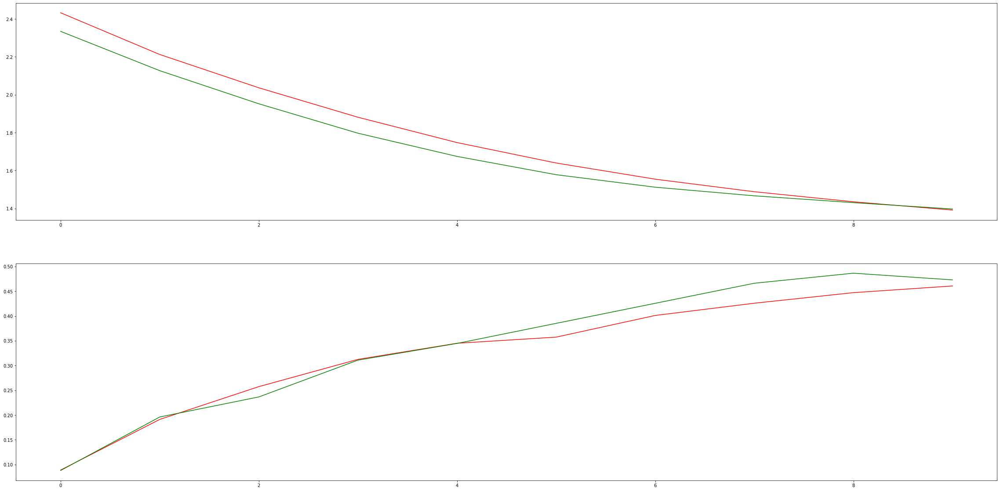

In [35]:
# Plot training and validation loss

plt.figure(figsize=(40, 20)) 
plt.subplot(2, 1, 1) 
plt.plot(history.history['loss'], c='r') 
plt.plot(history.history['val_loss'], c='g') 
plt.subplot(2, 1, 2) 
plt.plot(history.history['categorical_accuracy'],  c='r') 
plt.plot(history.history['val_categorical_accuracy'], c='g') 


plt.show()

In [36]:
# Evaluate
scores_tr = model.evaluate(xtr, ytr, verbose=0) 
print("Train %s: %.2f%%" % (model.metrics_names[1], scores_tr[1]*100))

scores_te = model.evaluate(xte, yte, verbose=0) 
print("Test %s: %.2f%%" % (model.metrics_names[1], scores_te[1]*100))


Train categorical_accuracy: 47.19%
Test categorical_accuracy: 50.00%


In [37]:
# Predict

# Train data
ytr_pred = model.predict_classes(xtr, verbose=0) 
get_class_report(ytr_bool,ytr_pred, encoder)

Classification Report:
              precision    recall  f1-score   support

         CYT       0.39      0.70      0.50       274
         ERL       0.00      0.00      0.00         1
         EXC       0.00      0.00      0.00        28
         ME1       0.00      0.00      0.00        29
         ME2       0.00      0.00      0.00        29
         ME3       0.76      0.35      0.48        84
         MIT       0.58      0.51      0.54       154
         NUC       0.52      0.44      0.48       261
         POX       0.67      0.40      0.50        15
         VAC       0.00      0.00      0.00        15

    accuracy                           0.47       890
   macro avg       0.29      0.24      0.25       890
weighted avg       0.46      0.47      0.44       890



Micro F1-score: 47.19%
Matthews Correlation Coefficient: 29.00%


In [38]:
# Validation data
yva_pred = model.predict_classes(xva, verbose=0)
get_class_report(yva_bool,yva_pred, encoder)

Classification Report:
              precision    recall  f1-score   support

         CYT       0.46      0.67      0.55        58
         EXC       0.00      0.00      0.00         2
         ME1       0.00      0.00      0.00         6
         ME2       0.00      0.00      0.00         4
         ME3       0.91      0.59      0.71        17
         MIT       0.28      0.31      0.29        16
         NUC       0.46      0.37      0.41        43
         VAC       0.00      0.00      0.00         2

    accuracy                           0.47       148
   macro avg       0.26      0.24      0.25       148
weighted avg       0.45      0.47      0.45       148



Micro F1-score: 47.30%
Matthews Correlation Coefficient: 24.09%


In [39]:
# Test data
yte_pred = model.predict(xte, batch_size=1, verbose=0) 
yte_pred_bool = np.argmax(yte_pred, axis=1)
get_class_report(yte_bool,yte_pred_bool, encoder)

Classification Report:
              precision    recall  f1-score   support

         CYT       0.43      0.81      0.56       131
         ERL       0.00      0.00      0.00         4
         EXC       0.00      0.00      0.00         5
         ME1       0.00      0.00      0.00         9
         ME2       0.00      0.00      0.00        18
         ME3       0.83      0.31      0.45        62
         MIT       0.55      0.54      0.54        74
         NUC       0.57      0.46      0.51       125
         POX       0.50      0.20      0.29         5
         VAC       0.00      0.00      0.00        13

    accuracy                           0.50       446
   macro avg       0.29      0.23      0.23       446
weighted avg       0.50      0.50      0.46       446



Micro F1-score: 50.00%
Matthews Correlation Coefficient: 34.57%


In [41]:
# Brute force layer units


for i in range(25,36):
    for j in range(25,36):
        results = ""
        for epochs in range(23,29):
            for batch_size in range(23,29):
                model = Sequential()
                model.add(Dense(i, input_dim=8, activation='relu'))
                model.add(Dense(j, activation='relu'))
                model.add(Dense(len(CLASSES), activation='softmax'))
                model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'])
                history = model.fit(xtr, ytr, validation_data=(xva, yva), epochs=epochs, batch_size=batch_size, verbose=0)

                ytr_pred = model.predict_classes(xtr, verbose=0) 
                f1tr = f1_score(ytr_bool, ytr_pred, average='macro')
                mcctr = matthews_corrcoef(ytr_bool, ytr_pred)

                yva_pred = model.predict_classes(xva, verbose=0) 
                f1va = f1_score(yva_bool, yva_pred, average='macro')
                mccva = matthews_corrcoef(yva_bool, yva_pred)

                yte_pred = model.predict_classes(xte, verbose=0)
                #yte_pred_bool = np.argmax(yte_pred, axis=1)
                f1te = f1_score(yte_bool, yte_pred, average='macro')
                mccte = matthews_corrcoef(yte_bool, yte_pred)

                results += "%d,%d,%d,%d,%.2f,%.2f,%.2f,%.2f,%.2f,%.2f\n" % (i,j,epochs,batch_size,f1tr,mcctr,f1va,mccva,f1tr,mccte)

    
        foo = open("resultsA.txt", "a")
        if(j==25):
            foo.write("layer1,layer2,epochs,batch_size,f1tr,mcctr,f1va,mccva,f1tr,mccte\n")
        foo.write(results)
        foo.close()
        print(i)




25
25
25
25
25
25
25
25
25
25
25
26
26
26
26
26
26
26
26
26
26


KeyboardInterrupt: 

In [189]:
resultsA = pd.read_csv('resultsA.csv')

In [190]:
resultsA.head(5)

,layer1,layer2,tr_cc,va_cc,te_cc,f1_tr,f1_va,f1_te,mcc_tr,mcc_va,mcc_te
0,15,10,0.607865,0.567568,0.607623,0.472847,0.501199,0.466771,0.491734,0.408243,0.495685
1,15,11,0.620225,0.560811,0.582960,0.492579,0.492854,0.462212,0.510406,0.394683,0.465978
2,15,12,0.615730,0.587838,0.603139,0.489197,0.485627,0.440674,0.501771,0.431134,0.490509
3,15,13,0.617977,0.527027,0.589686,0.497914,0.478952,0.473781,0.510430,0.345097,0.481265
4,15,14,0.613483,0.540541,0.616592,0.584211,0.366521,0.513487,0.498371,0.373232,0.507535


In [1]:
resultsA.max()

NameError: name 'resultsA' is not defined